In [1]:
import os
import pandas as pd
import pretty_midi
import numpy as np
import h5py
import matplotlib.pyplot as plt

FS = 100
SAMPLE_MID_OUTPUT = "output.mid"
SAMPLE_NUMBER = 17
FS_AUDIO = 22050

NOTE_DURATION_VARIATION = 10
INTENSITY_VARIATION = 1
RANDOM_NOTE_PROBABILITY = 0.01
DURATION_NOTE_PROBABILITY = 0.1
INTENSE_NOTE_PROBABILITY = 0.01

In [2]:
def extract_midi_features_with_piano_roll(midi_file, file_path_h5, fs=FS):
    try:
               # Carregar o arquivo MIDI
        midi_data = pretty_midi.PrettyMIDI(midi_file)

        # Calcular o piano roll (todas as notas, em uma frequência de amostragem definida)
        piano_roll = midi_data.get_piano_roll(fs=FS)

        # Encontrar o primeiro frame com notas tocando (não-zero)
        first_non_zero_frame = np.argmax(np.any(piano_roll != 0, axis=0))

        # Calcular o número de frames correspondente a 10 segundos após o primeiro frame com notas
        max_frames = fs * 10
        start_frame = first_non_zero_frame
        end_frame = start_frame + max_frames

        # Verificar se há frames suficientes
        if end_frame > piano_roll.shape[1]:
            print(f"A música não tem 10 segundos após o início com notas tocando. Extraindo até o final.")
            end_frame = piano_roll.shape[1]

        # Recortar o piano roll para os 10 segundos após o primeiro frame com notas
        piano_roll_10s = piano_roll[:, start_frame:end_frame]

        # Abrir o arquivo H5 para obter os artist_terms e seus pesos
        with h5py.File(file_path_h5, 'r') as h5_file:
            artist_terms = h5_file['metadata']['artist_terms'][:]
            artist_terms_weight = h5_file['metadata']['artist_terms_weight'][:]

        # Decodificar os artist_terms se necessário
        artist_terms = [term.decode('utf-8') for term in artist_terms]

        # Criar um dicionário com os artist_terms como colunas e os pesos como valores
        artist_terms_dict = {term: weight for term, weight in zip(artist_terms, artist_terms_weight)}

        # Retornar os dados
        return {
            "piano_roll_10s": piano_roll_10s,
            **artist_terms_dict,  # Adiciona os artist_terms como colunas dinamicamente
        }

    except Exception as e:
        print(f"Erro ao processar {midi_file}: {e}")
        return {
            "piano_roll_10s": None,
        }
    

def create_midi_dataframe_with_piano_roll(source_dir):
    midi_data = []
    
    for root, _, files in os.walk(source_dir):
        for file in files:
            if file.endswith(".mid") or file.endswith(".midi"):
                file_path = os.path.join(root, file)
                file_path_h5 = root.replace("lmd_matched", "lmd_matched_h5") + ".h5"
                features = {
                    "file_path": file_path,
                    "file_path_h5": file_path_h5,
                }
                features.update(extract_midi_features_with_piano_roll(file_path, file_path_h5))
                midi_data.append(features)
                break
    
    return pd.DataFrame(midi_data)

paths = ['A']
# paths = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I']

for i in paths:
    for j in paths:
        source_directory_midi = f"lmd_matched/lmd_matched/{i}/{j}"
        midi_df = create_midi_dataframe_with_piano_roll(source_directory_midi)
        midi_df.to_pickle(f"dbs/midi_dataset_with_piano_roll_{i}{j}.pkl")


Erro ao processar lmd_matched/lmd_matched/A/A/S/TRAASMT12903CC238B/913503a9957064c04d5cc72e351bf485.mid: data byte must be in range 0..127


/home/junio/.local/lib/python3.10/site-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(


In [3]:
# Caminho para o arquivo pickle
pickle_file = "dbs/midi_dataset_with_piano_roll_AA.pkl"

# Carregar o pickle em um DataFrame
df = pd.read_pickle(pickle_file)
df = df.dropna(subset=['piano_roll_10s'])
df = df.fillna(0)
df

,file_path,file_path_h5,piano_roll_10s,dance pop,madchester,europop,electropop,eurodance,jazz,club,...,triple j,speed garage,uk garage,neofolk,neo soul,crunk,quiet storm,jangle pop,new romantic,college rock
0,lmd_matched/lmd_matched/A/A/V/TRAAVUT128F92F74...,lmd_matched_h5/lmd_matched_h5/A/A/V/TRAAVUT128...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1.000000,0.751132,0.751132,0.723876,0.718120,0.710134,0.707684,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,lmd_matched/lmd_matched/A/A/X/TRAAXWM128F428A0...,lmd_matched_h5/lmd_matched_h5/A/A/X/TRAAXWM128...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,lmd_matched/lmd_matched/A/A/F/TRAAFMT128F429DB...,lmd_matched_h5/lmd_matched_h5/A/A/F/TRAAFMT128...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",0.000000,0.000000,0.000000,0.000000,0.000000,0.464799,0.601848,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,lmd_matched/lmd_matched/A/A/E/TRAAEJH128E07855...,lmd_matched_h5/lmd_matched_h5/A/A/E/TRAAEJH128...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",0.000000,0.000000,0.000000,0.000000,0.000000,0.634876,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,lmd_matched/lmd_matched/A/A/E/TRAAEEH128E0795D...,lmd_matched_h5/lmd_matched_h5/A/A/E/TRAAEEH128...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",0.000000,0.000000,0.888676,0.000000,0.000000,0.728263,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,lmd_matched/lmd_matched/A/A/A/TRAAAZF12903CCCF...,lmd_matched_h5/lmd_matched_h5/A/A/A/TRAAAZF129...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",0.000000,0.000000,0.889915,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,lmd_matched/lmd_matched/A/A/A/TRAAAGR128F425B1...,lmd_matched_h5/lmd_matched_h5/A/A/A/TRAAAGR128...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,lmd_matched/lmd_matched/A/A/W/TRAAWSJ128F933D7...,lmd_matched_h5/lmd_matched_h5/A/A/W/TRAAWSJ128...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",0.000000,0.000000,0.846566,0.000000,0.000000,0.736289,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,lmd_matched/lmd_matched/A/A/Z/TRAAZJU12903C980...,lmd_matched_h5/lmd_matched_h5/A/A/Z/TRAAZJU129...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,lmd_matched/lmd_matched/A/A/Z/TRAAZVG128F425A9...,lmd_matched_h5/lmd_matched_h5/A/A/Z/TRAAZVG128...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [4]:
import pretty_midi
from IPython.display import Audio

def midi_to_audio(midi_file, fs=FS_AUDIO):  # Usando uma taxa de amostragem mais alta
    try:
        # Carregar o arquivo MIDI
        midi_data = pretty_midi.PrettyMIDI(midi_file)

        # Gerar a MIDI a partir do arquivo MIDI
        midi = pretty_midi.PrettyMIDI()

        # Criar uma nova instrumento para o piano
        instrument = pretty_midi.Instrument(program=pretty_midi.instrument_name_to_program('Acoustic Grand Piano'))

        # Copiar todas as notas dos instrumentos presentes no arquivo midi original para o novo instrumento
        for instrument_data in midi_data.instruments:
            for note in instrument_data.notes:
                start_time = note.start
                end_time = note.end
                pitch = note.pitch
                velocity = note.velocity

                # Adicionar as notas ao nosso novo instrumento
                new_note = pretty_midi.Note(velocity=velocity, pitch=pitch, start=start_time, end=end_time)
                instrument.notes.append(new_note)

        # Adicionar o instrumento à MIDI
        midi.instruments.append(instrument)

        # Garantir que o áudio gerado não ultrapasse o tempo real do arquivo MIDI
        midi_length = midi.get_end_time()  # Duração total do MIDI
        print(f'Duração total do MIDI: {midi_length} segundos')

        # Gerar áudio usando a função fluidsynth
        audio = midi.fluidsynth(fs=fs)

        return audio  # Retorna o áudio gerado
    except Exception as e:
        print(f"Erro ao gerar áudio do arquivo MIDI: {e}")
        return None

In [5]:
def add_noise_to_pianoroll(piano_roll, 
                           fs=FS, 
                           note_duration_variation=NOTE_DURATION_VARIATION, 
                           intensity_variation=INTENSITY_VARIATION, 
                           random_note_probability=RANDOM_NOTE_PROBABILITY, 
                           duration_note_probability=DURATION_NOTE_PROBABILITY, 
                           intense_note_probability=INTENSITY_VARIATION):

    num_notes = piano_roll.shape[0]
    num_frames = piano_roll.shape[1]
    
    for i in range(num_notes):
        for j in range(num_frames):
            if np.random.rand() < random_note_probability: 
                piano_roll[i, j] = 1 
    
    for i in range(num_notes):
        for j in range(num_frames):
            if piano_roll[i, j] > 0: 
                if np.random.rand() < duration_note_probability:
                    if j + 10 < num_frames:  
                        piano_roll[i, j:j + note_duration_variation] = 1 
                    else:
                        piano_roll[i, j:] = 1 
    
    for i in range(num_notes):
        for j in range(num_frames):
            if piano_roll[i, j] > 0: 
                if np.random.rand() < intense_note_probability:
                    variation = np.random.uniform(1 - intensity_variation, 1 + intensity_variation)
                    piano_roll[i, j] *= variation 

    piano_roll = np.clip(piano_roll, 0, 1)
    
    return piano_roll

In [6]:
def print_pianoroll_normal_noised(piano_roll, noisy_piano_roll):

    # Exibir ambos os piano rolls (original e com ruído) lado a lado
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))  # Cria uma figura com 2 subplots lado a lado

    # Plotar o piano roll original
    cax0 = axes[0].imshow(piano_roll, aspect='auto', cmap='gray_r', origin='lower', interpolation='nearest')
    axes[0].set_title('Piano Roll Original')
    axes[0].set_xlabel('Tempo')
    axes[0].set_ylabel('Notas')
    fig.colorbar(cax0, ax=axes[0], label='Atividade (nota ativa)')

    # Plotar o piano roll com ruído
    cax1 = axes[1].imshow(noisy_piano_roll, aspect='auto', cmap='gray_r', origin='lower', interpolation='nearest')
    axes[1].set_title('Piano Roll com Ruído')
    axes[1].set_xlabel('Tempo')
    axes[1].set_ylabel('Notas')
    fig.colorbar(cax1, ax=axes[1], label='Atividade (nota ativa)')

    # Ajuste automático do layout
    plt.tight_layout()

    # Exibir os gráficos
    plt.show()

In [7]:
import pretty_midi
import numpy as np

def pianoroll_to_midi(piano_roll, fs=FS, output_midi_path=SAMPLE_MID_OUTPUT):
    try:
        # Criação de uma instância PrettyMIDI
        midi = pretty_midi.PrettyMIDI()
        
        # Criar uma nova instância de instrumento (piano)
        piano = pretty_midi.Instrument(program=pretty_midi.instrument_name_to_program('Acoustic Grand Piano'))

        # Percorrer as notas do piano roll
        num_notes, num_frames = piano_roll.shape
        for i in range(num_notes):
            for j in range(num_frames):
                if piano_roll[i, j] > 0:  # Se a nota está ativa
                    start_time = j / fs  # Tempo de início
                    end_time = (j + 1) / fs  # Tempo de término (duração da nota)
                    pitch = i + 21  # Mapeamento de índice de nota para pitch (padrão de 88 teclas)
                    
                    # Garantir que o pitch esteja dentro do intervalo válido (0 a 127)
                    if pitch < 0:
                        pitch = 0
                    elif pitch > 127:
                        pitch = 127
                    
                    note = pretty_midi.Note(velocity=100, pitch=pitch, start=start_time, end=end_time)  # Adiciona a nota
                    piano.notes.append(note)
        
        # Adicionar o instrumento ao arquivo MIDI
        midi.instruments.append(piano)
        
        # Salvar o arquivo MIDI
        midi.write(output_midi_path)
        print(f"MIDI salvo em: {output_midi_path}")
    except Exception as e:
        print(f"Erro ao converter piano roll para MIDI: {e}")




In [8]:
midi_file = df.iloc[SAMPLE_NUMBER, 0]

audio = midi_to_audio(midi_file, fs=FS_AUDIO)

Audio(audio, rate=FS_AUDIO)

Duração total do MIDI: 163.4670137447917 segundos


In [9]:
piano_roll = df.iloc[SAMPLE_NUMBER, 2] 

midi = pianoroll_to_midi(piano_roll, fs=FS)

audio = midi_to_audio(SAMPLE_MID_OUTPUT, FS_AUDIO)

Audio(audio, rate=FS_AUDIO)

MIDI salvo em: output.mid
Duração total do MIDI: 9.979545454545454 segundos


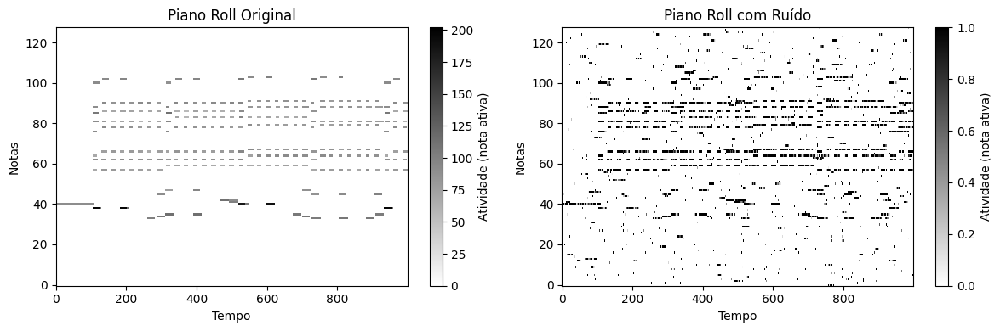

In [10]:
piano_roll_to_noise = df.iloc[SAMPLE_NUMBER, 2].copy()

noisy_piano_roll = add_noise_to_pianoroll(piano_roll_to_noise, fs=FS)

print_pianoroll_normal_noised(df.iloc[SAMPLE_NUMBER, 2], noisy_piano_roll)

In [11]:
pianoroll_to_midi(noisy_piano_roll, fs=FS, output_midi_path=SAMPLE_MID_OUTPUT)

audio = midi_to_audio(SAMPLE_MID_OUTPUT, fs=FS_AUDIO)

Audio(audio, rate=FS_AUDIO)

MIDI salvo em: output.mid
Duração total do MIDI: 10.0 segundos


In [12]:
df['noisy_piano_roll'] = df['piano_roll_10s'].apply(lambda x: add_noise_to_pianoroll(x, fs=FS))

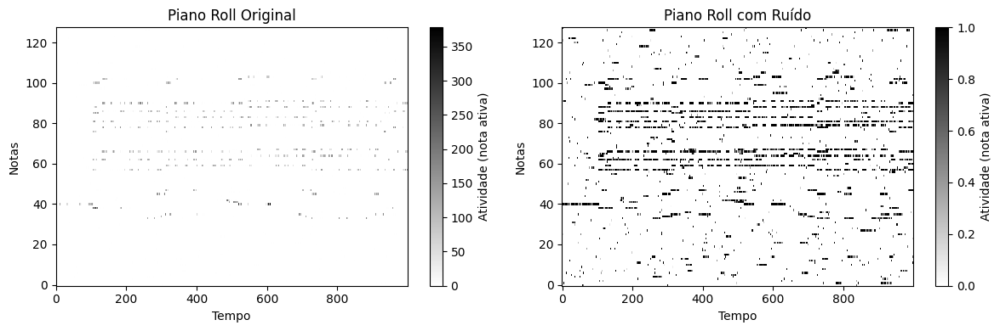

In [13]:
print_pianoroll_normal_noised(df.iloc[SAMPLE_NUMBER, 2], df.iloc[SAMPLE_NUMBER, -1])

In [14]:
tag_columns = df.columns[3:-1]
tag_columns

Index(['dance pop', 'madchester', 'europop', 'electropop', 'eurodance', 'jazz',
       'club', 'grunge', 'celtic', 'disco',
       ...
       'triple j', 'speed garage', 'uk garage', 'neofolk', 'neo soul', 'crunk',
       'quiet storm', 'jangle pop', 'new romantic', 'college rock'],
      dtype='object', length=400)

In [15]:
tag_sums = df[tag_columns].sum(axis=0)
tag_sums.tolist()

[4.712913422704242,
 1.6033744823892153,
 11.895581747836626,
 0.7238760772579573,
 2.07946999342436,
 15.671838045679161,
 3.986720071981609,
 2.409699089191413,
 1.5045979976862527,
 14.82554783642038,
 22.426256886073034,
 2.8563048702624627,
 10.981283226602006,
 4.2703145223225984,
 8.516568655282791,
 4.461228650251167,
 4.994199685745157,
 27.54307589637557,
 11.896442286550434,
 3.647897510004614,
 5.656939721087778,
 12.137187379311756,
 5.218985693064579,
 2.46068811882857,
 0.9265762113002456,
 0.561374008087571,
 20.854516303675382,
 0.919116537744495,
 3.3500620889871437,
 5.080114091101253,
 12.615693347012972,
 2.446775909435311,
 6.091254816276882,
 11.313979526871906,
 4.339024073763261,
 4.675775204166857,
 1.6621607038512114,
 0.9006929667459987,
 2.87148754633704,
 1.3076630985272253,
 0.5560496517936112,
 0.5238839222658421,
 13.714537254227059,
 0.7843315719938465,
 0.7841355695936495,
 0.6340021927695687,
 4.460278141841206,
 0.7946136718723806,
 0.69477670667522

In [16]:
limiar = 0.1 * len(df)

tags_a_manter = tag_sums >= limiar
tags_a_manter

dance pop        True
madchester      False
europop          True
electropop      False
eurodance       False
                ...  
crunk           False
quiet storm     False
jangle pop      False
new romantic    False
college rock    False
Length: 400, dtype: bool

In [17]:
df_filtrado = df.loc[:, ['file_path', 'file_path_h5', 'piano_roll_10s', 'noisy_piano_roll'] + list(tag_columns[tags_a_manter])]

In [18]:
tag_columns = df_filtrado.columns[4:]
tag_columns_size = len(tag_columns)
tag_columns_size

62

In [19]:
(df_filtrado[tag_columns].sum(axis=1) == 0).sum()

np.int64(0)

In [20]:
from sklearn.model_selection import train_test_split
import jax.numpy as jnp
import jax

X = df['piano_roll_10s'].values
y = df[tag_columns].values

X = jnp.array([x.reshape(128, 1000) for x in X])
y = jnp.array(y)

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.2, random_state=42)

In [21]:
batch_size = 14
X_batches = X_train.reshape((X_train.shape[0] // batch_size,
                             batch_size,
                             X_train.shape[1],
                             X_train.shape[2]))
Y_batches = y_train.reshape((y_train.shape[0] // batch_size,
                             batch_size,
                             y_train.shape[1]))

In [22]:
X_batches = jnp.expand_dims(X_batches, -1)
X_batches.shape

(2, 14, 128, 1000, 1)

In [23]:
X_batches.shape

(2, 14, 128, 1000, 1)

In [24]:
Xb, Yb = X_batches[0], Y_batches[0]
Xb.shape

(14, 128, 1000, 1)

In [25]:
Yb.shape

(14, 62)

In [26]:
import flax.linen as nn

CLASSES = 62
ALTURA = 128

class Baseline(nn.Module):
    @nn.compact
    def __call__(self, x):
        x = nn.Conv(features=3, kernel_size=(5, 5), strides=(1, 1), padding=0)(x)
        x = nn.relu(x)
        x = nn.max_pool(x, window_shape=(3, 3), strides=(1, 1))

        x = nn.Conv(features=3, kernel_size=(3, 3), strides=(1, 1), padding=0)(x)
        x = nn.relu(x)
        x = nn.max_pool(x, window_shape=(2, 2), strides=(1, 1))

        x = nn.Conv(features=3, kernel_size=(2, 2), strides=(1, 1), padding=0)(x)
        x = nn.relu(x)
        x = nn.max_pool(x, window_shape=(2, 2), strides=(1, 1))

        x = nn.avg_pool(x, window_shape=(1, ))
        x = x.reshape((x.shape[0], -1)) 
        x = nn.Dense(CLASSES)(x)
        return x

In [27]:
class ExtractFeatures(nn.Module):
    @nn.compact
    def __call__(self, x):
        for _ in range(3):
            x = nn.Conv(ALTURA, kernel_size=(3, ), strides=(1, ))(x)
            x = nn.relu(x)
            x = nn.max_pool(x, window_shape=(3, ), strides=(1, ))
        x = nn.avg_pool(x, window_shape=(1, ))
        x = x.reshape((x.shape[0], -1)) 
        x = nn.Dense(CLASSES)(x)
        return x

In [28]:
model = Baseline()
variables = model.init(jax.random.PRNGKey(0), jnp.ones(Xb.shape))

In [29]:
jax.tree_map(lambda x: sum(x.shape), variables)

/tmp/ipykernel_1536/371042742.py:1: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  jax.tree_map(lambda x: sum(x.shape), variables)


{'params': {'Conv_0': {'bias': 3, 'kernel': 14},
  'Conv_1': {'bias': 3, 'kernel': 12},
  'Conv_2': {'bias': 3, 'kernel': 10},
  'Dense_0': {'bias': 62, 'kernel': 347201}}}

In [30]:
variables['params']['Conv_0']

{'kernel': Array([[[[ 0.13446388, -0.05790909,  0.09318226]],
 
         [[-0.24129227,  0.07360326,  0.16606456]],
 
         [[-0.05279797, -0.09611308,  0.11607265]],
 
         [[-0.10820542,  0.01476127,  0.21225144]],
 
         [[-0.30678207,  0.05407789, -0.15928738]]],
 
 
        [[[ 0.09315899, -0.02072655,  0.00527022]],
 
         [[-0.01593207,  0.07893895,  0.03431147]],
 
         [[-0.41596815,  0.190921  ,  0.0442724 ]],
 
         [[ 0.05278645,  0.1035486 , -0.19695641]],
 
         [[ 0.3906921 ,  0.12130415, -0.20387374]]],
 
 
        [[[ 0.13254188, -0.31265274, -0.19159776]],
 
         [[ 0.34007573,  0.39745435, -0.33810523]],
 
         [[-0.18673122,  0.31405464, -0.2971612 ]],
 
         [[-0.05905948,  0.30824602,  0.24114828]],
 
         [[ 0.13523051,  0.03763475, -0.00785285]]],
 
 
        [[[-0.09033414, -0.44746107,  0.2124954 ]],
 
         [[-0.06737462, -0.0656131 , -0.08575695]],
 
         [[ 0.13229424, -0.37050807,  0.39312556]],
 
         

In [31]:
logits = Baseline().apply(variables, Xb)
logits.shape

(14, 62)

In [32]:
@jax.jit
def cross_entropy_loss(logits, Yb):
    return -jnp.mean(jnp.sum(Yb * logits, axis=-1))

In [33]:
Yb.shape

(14, 62)

In [34]:
logits = Baseline().apply(variables, Xb)
cross_entropy_loss(logits, Yb)

Array(61.018604, dtype=float32)

In [35]:
@jax.jit
def train_step(Xb, Yb, state):
    def loss_fn(params):
        logits = Baseline().apply({'params': params}, Xb)
        loss = cross_entropy_loss(logits, Yb)
        return loss
    grad_fn = jax.grad(loss_fn)
    grads = grad_fn(state.params)
    state = state.apply_gradients(grads=grads)
    return state, loss_fn(state.params)

In [36]:
from flax.training import train_state
import optax

model = Baseline()
variables = model.init(jax.random.PRNGKey(0), jnp.ones(Xb.shape))

lr = 0.0005
iter = 50

params = variables['params']
tx = optax.sgd(learning_rate=lr)
state = train_state.TrainState.create(apply_fn=model.apply,
                                      params=params,
                                      tx=tx)
for i in range(iter):
    for Xb, Yb in zip(X_batches, Y_batches):
        state, _ = train_step(Xb, Yb, state)
    train_loss = cross_entropy_loss(Baseline().apply({'params': state.params},
                                                     X_train),
                                    y_train)
    val_loss = cross_entropy_loss(Baseline().apply({'params': state.params},
                                                   X_val),
                                  y_val)
    if i % 10 == 0:
        print('Iter: {}; Train Loss {}; Val Loss = {}'.format(i, train_loss,
                                                              val_loss))

ScopeParamShapeError: Initializer expected to generate shape (5, 5, 1, 3) but got shape (5, 5, 1000, 3) instead for parameter "kernel" in "/Conv_0". (https://flax.readthedocs.io/en/latest/api_reference/flax.errors.html#flax.errors.ScopeParamShapeError)